In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
%matplotlib inline

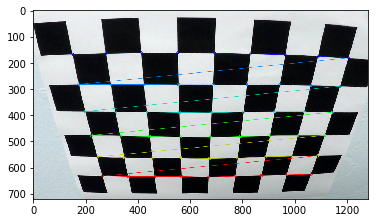

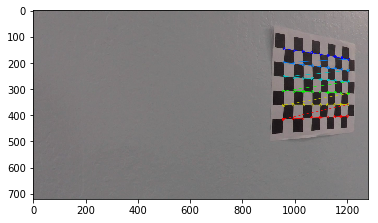

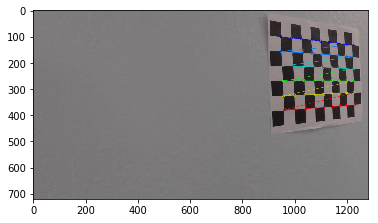

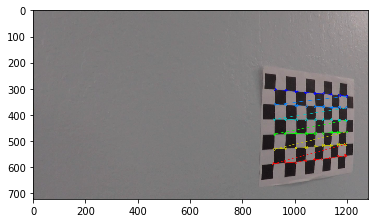

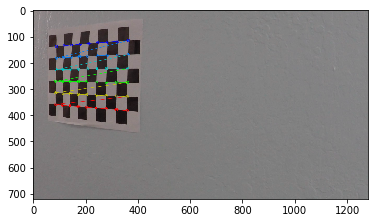

...

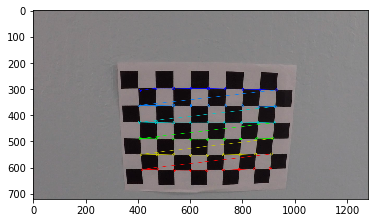

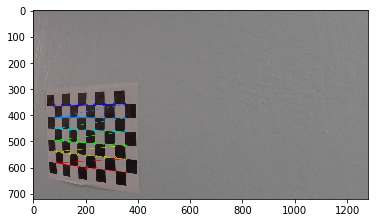

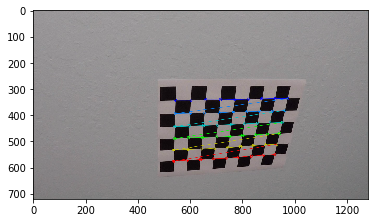

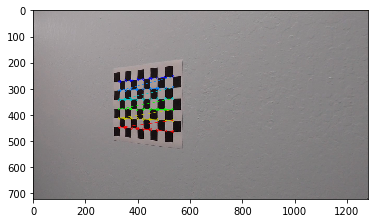

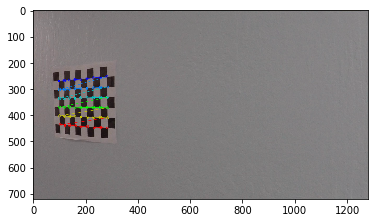

In [2]:
def cam_calibration(path, nx=9, ny=6):
    # Prepare object points to store the corners in 3D coordinates
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
    images = []
    for filename in os.listdir(path):
        #img = cv2.cvtColor(cv2.imread(os.path.join(path,filename)), cv2.COLOR_BGR2RGB)
        img = cv2.imread(os.path.join(path,filename))
        if img is not None:
            images.append(img)
    
    # Lists for object points and chessboard corners for calibration
    obj_pnts = [] # 3d points in real world space
    img_pnts = [] # 2d points in image plane.
    
    for img in images:
        # Convert images to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Find chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        
        if ret == True: # if corners found
            obj_pnts.append(objp)
            img_pnts.append(corners)
            cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            plt.imshow(img)
            plt.show()
    
    # Calibrate camera with found parameters
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_pnts, img_pnts, img_size, None, None)
    
    return mtx, dist

path = 'camera_cal/'
mtx, dist = cam_calibration(path)

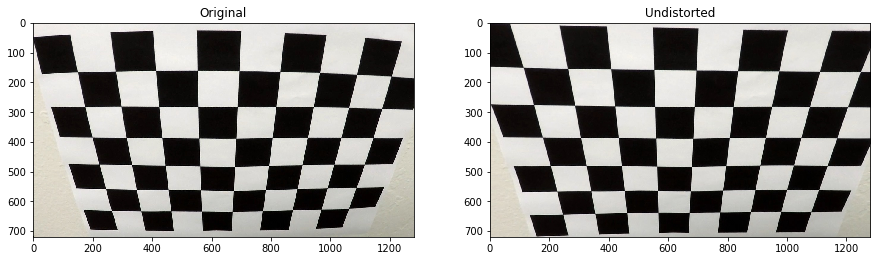

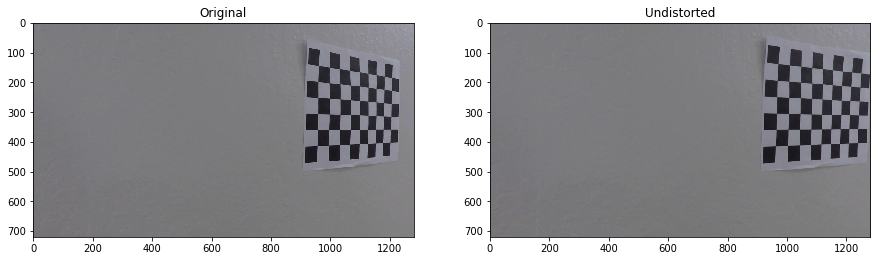

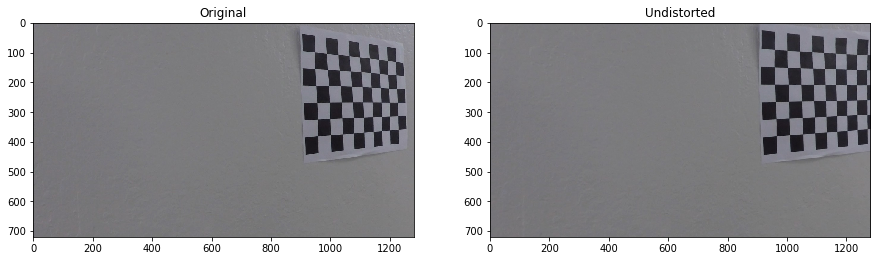

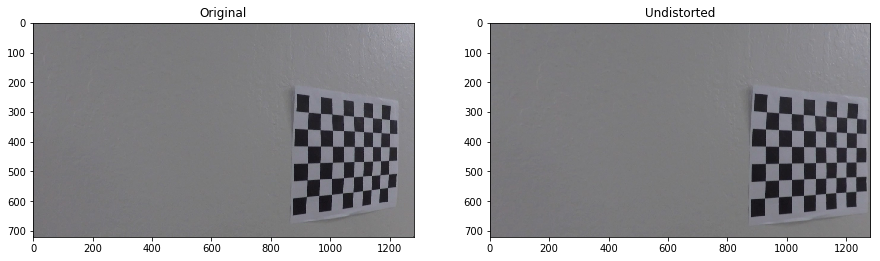

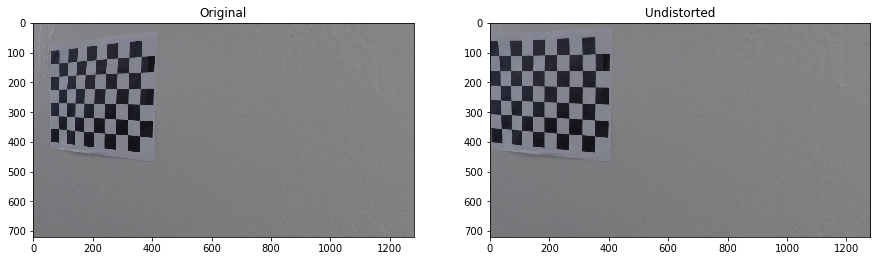

...

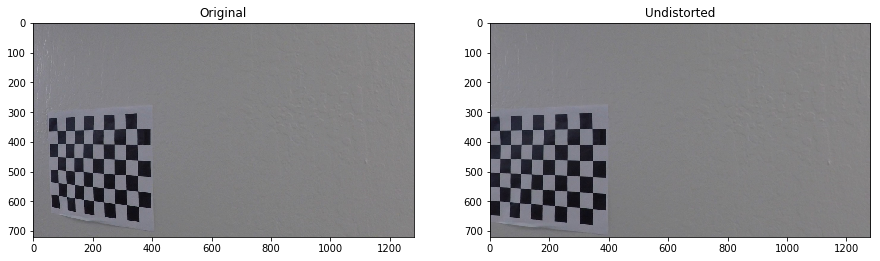

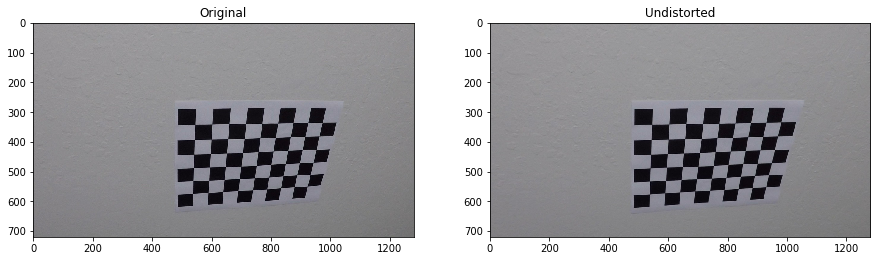

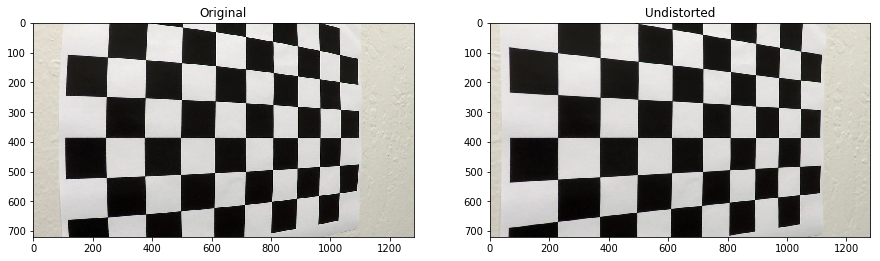

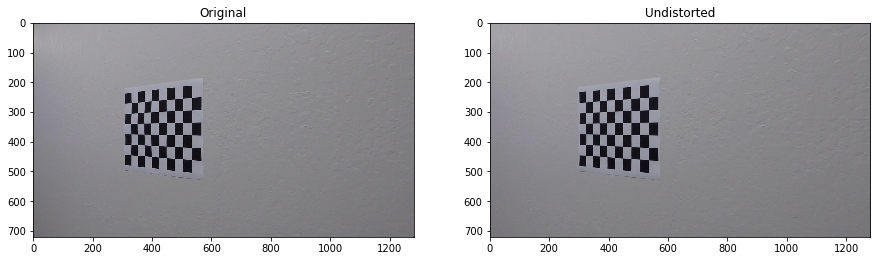

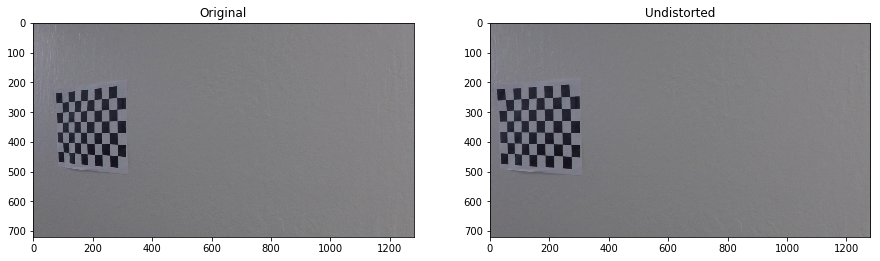

In [3]:
# Function to undistort images
def undistort(img, mtx, dist):
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    return undistorted

images = []
for filename in os.listdir(path):
    img = cv2.cvtColor(cv2.imread(os.path.join(path,filename)), cv2.COLOR_BGR2RGB)
    if img is not None:
        images.append(img)

for img in images:
    und_im = undistort(img, mtx, dist)
    f, ax = plt.subplots(1, 2, figsize=(15,12))
    ax[0].imshow(img)
    ax[0].set_title('Original')
    ax[1].imshow(und_im)
    ax[1].set_title('Undistorted')
plt.show()

# 1. Camera Calibration and Distorsion Correction

The images obtained from 3D world to 2D projection have variations in the shape and size on the objects. Those errors are induced by either the lenses of the camera, or the misalignment of the sensor with respect to the optical axis. Hence, it is necessary to perform a calibration in order to get rid of image distorsions.

For doing this, a chessboard provides a good approximation in order to find the distorsions on the image, and correct the images taken based on that information

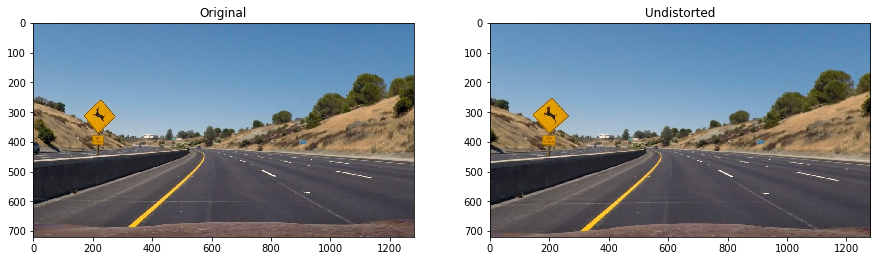

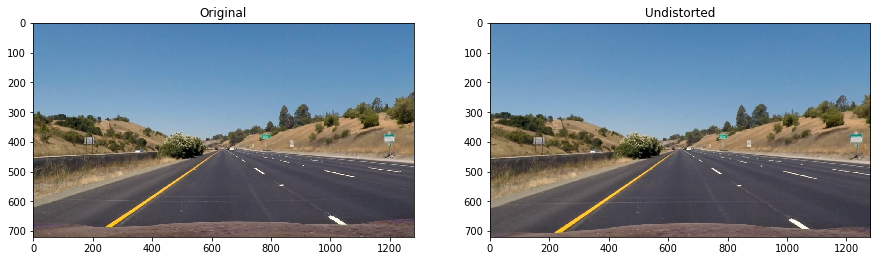

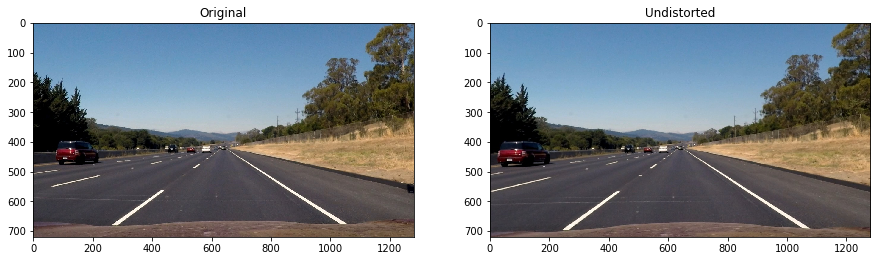

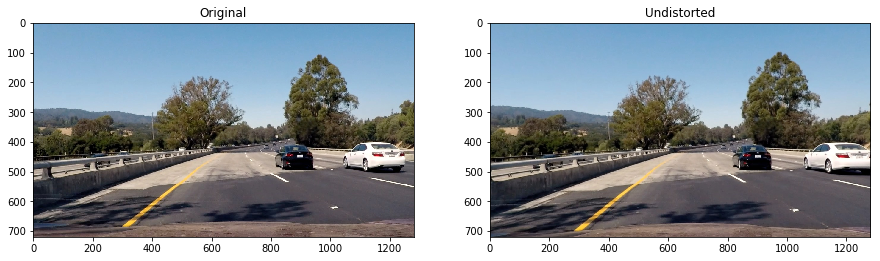

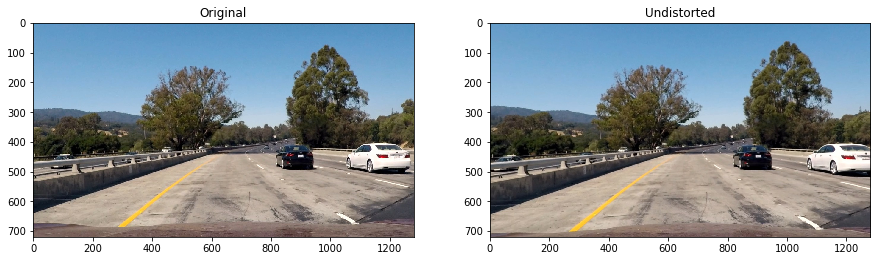

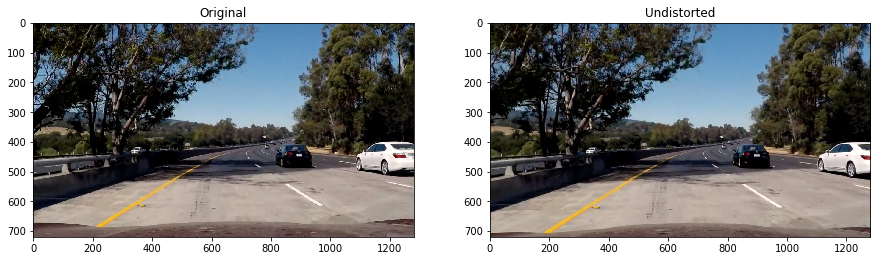

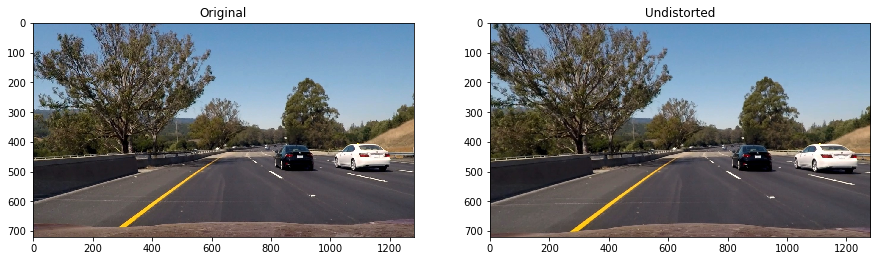

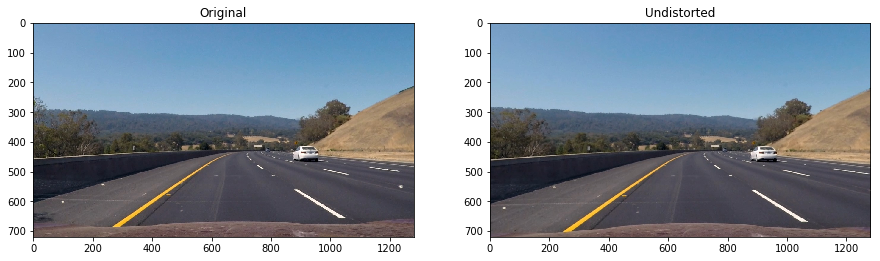

In [4]:
# Undistort all the test images
test_path = 'test_images/'
test_imgs = []
for filename in os.listdir(test_path):
    img = cv2.cvtColor(cv2.imread(os.path.join(test_path,filename)), cv2.COLOR_BGR2RGB)
    if img is not None:
        test_imgs.append(img)

for test_im in test_imgs:
    und_im = undistort(test_im, mtx, dist)
    f, ax = plt.subplots(1, 2, figsize=(15, 12))
    ax[0].imshow(test_im)
    ax[0].set_title('Original')
    ax[1].imshow(und_im)
    ax[1].set_title('Undistorted')
plt.show()

# 2. Perspective Transformation

After the correction of the image distorsion, a perspective transformation is a good way for detecting better the lane lines. This is also called a "bird's-eye view" (or top-down view) of the terrain ahead the car.

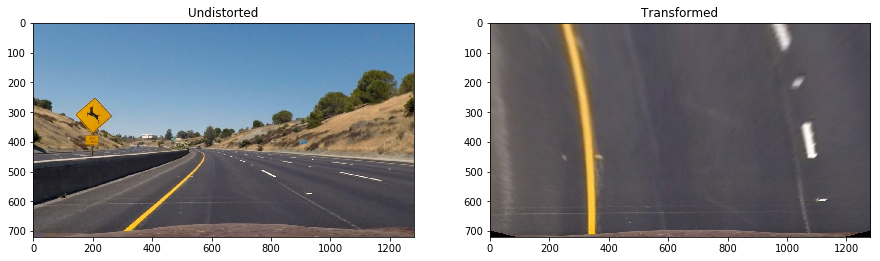

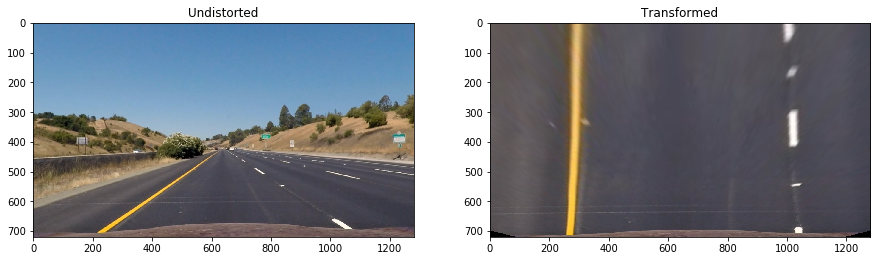

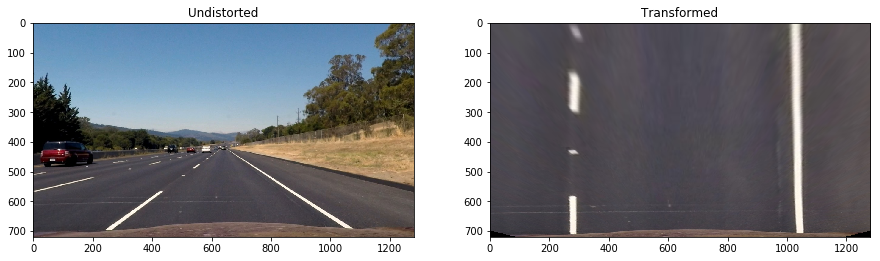

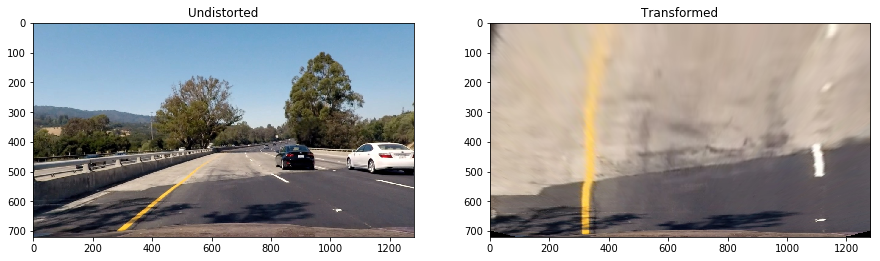

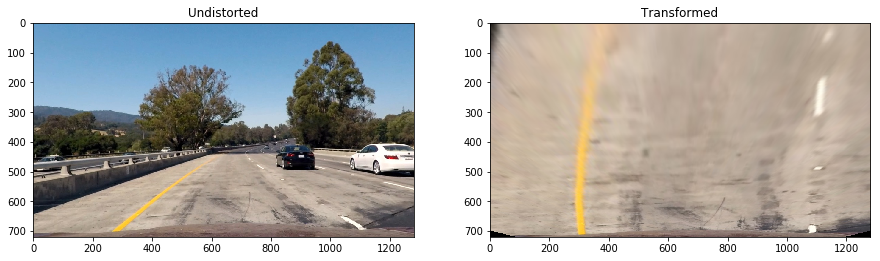

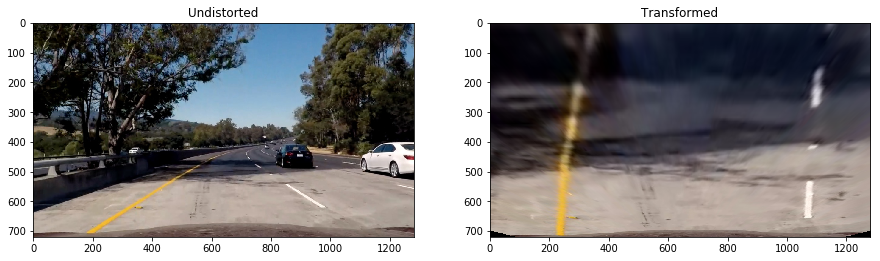

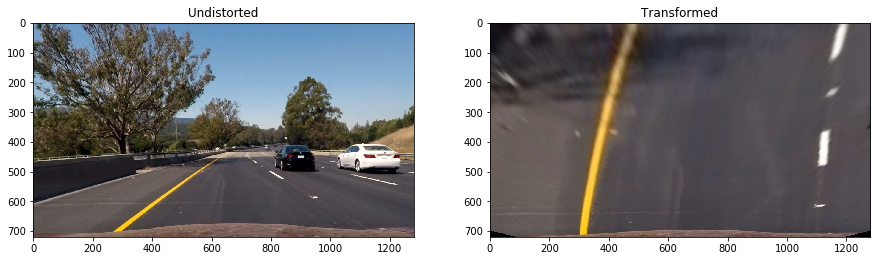

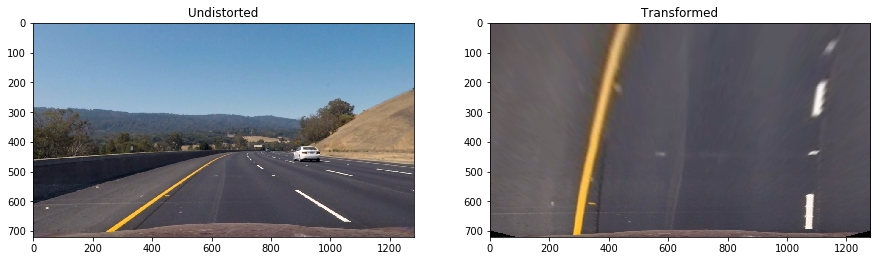

In [5]:
# Function to get the perspective transform
def PerspTransf(img_path):
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    img_w = img.shape[1]
    img_h = img.shape[0]
    
    src = np.float32([(img_w * 0.44, img_h * 0.65),(img_w * 0.56, img_h * 0.65),(img_w * 0.85, img_h),(img_w * 0.15, img_h)])
    dst = np.float32([(img_w * 0.2, img_h * 0.1),(img_w * 0.8, img_h * 0.1),(img_w * 0.8, img_h),(img_w * 0.2, img_h)])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M, Minv

# Obtain the prespective transform matrices 
M, Minv = PerspTransf('./test_images/test2.jpg')

test_path = 'test_images/'
test_imgs = []
for filename in os.listdir(test_path):
    img = cv2.cvtColor(cv2.imread(os.path.join(test_path,filename)), cv2.COLOR_BGR2RGB)
    if img is not None:
        test_imgs.append(img)

for test_im in test_imgs:
    und_im = undistort(test_im, mtx, dist)  
    birds = cv2.warpPerspective(und_im, M, (test_im.shape[1], test_im.shape[0]), flags=cv2.INTER_LINEAR)
    f, ax = plt.subplots(1, 2, figsize=(15,12))
    ax[0].imshow(und_im)
    ax[0].set_title('Undistorted')
    ax[1].imshow(birds)
    ax[1].set_title('Transformed')
plt.show()

# 3. Image Filtering

After the top-down view is obtained, it is possible to detect the lines applying gradient, magnitude, and color filters, wihtout taking into account other object into the image.

In [6]:
# Function for taking an image, orientation gradient
def abs_sobel_threshold(img, orient='x', min_thresh=0, max_thresh=255):
    # Grayscale conversion
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y direction for Sobel filter
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    elif orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create an image copy and apply threshold
    binary_img = np.zeros_like(scaled_sobel)
    binary_img[(scaled_sobel >= min_thresh) & (scaled_sobel <= max_thresh)] = 1
    return binary_img

# Function for gradient magnitude
def mag_threshold(img, sobel_kernel=3, thresh=(0, 255)):
    #Grayscale conversion
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply Sobel x and y gradients
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    sobel = np.sqrt(sobel_x**2 + sobel_y**2)
    # Rescale to 8 bit integer
    sobel = np.uint8(255*sobel/np.max(sobel))
    # Create an image copy and apply threshold
    binary_img = np.zeros_like(sobel)
    binary_img[(sobel >= thresh[0]) & (sobel <= thresh[1])] = 1
    return binary_img

# Function for direction gradient
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale conversion
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Absolute value of the gradient direction and apply threshold
    abs_dir_grad = np.arctan2(np.absolute(sobel_y), np.absolute(sobel_x))
    binary_img =  np.zeros_like(abs_dir_grad)
    binary_img[(abs_dir_grad >= thresh[0]) & (abs_dir_grad <= thresh[1])] = 1
    return binary_img

# Function to filter colors
def color_threshold(img):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    yellow_min = np.array([15, 100, 120], np.uint8)
    yellow_max = np.array([80, 255, 255], np.uint8)
    yellow_mask = cv2.inRange(img, yellow_min, yellow_max)

    white_min = np.array([0, 0, 200], np.uint8)
    white_max = np.array([255, 30, 255], np.uint8)
    white_mask = cv2.inRange(img, white_min, white_max)

    binary_output = np.zeros_like(img[:, :, 0])
    binary_output[((yellow_mask != 0) | (white_mask != 0))] = 1

    filtered = img
    filtered[((yellow_mask == 0) & (white_mask == 0))] = 0

    return binary_output

def hls_threshold(img, thresh=(100, 255)):
    # Convert to HLS space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # Take only S channel and prouce binary image from it
    s_channel = hls[:,:,2]
    binary_img = np.zeros_like(s_channel)
    binary_img[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_img

# Function to put all filters into one
def all_thresholds(img):
    abs_img = abs_sobel_threshold(img, orient='x', min_thresh=30, max_thresh=255)
    mag_img = mag_threshold(img, sobel_kernel=3, thresh=(50, 255))
    dir_img = dir_threshold(img, sobel_kernel=15, thresh=(0.6, 1.2))
    hls_img = hls_threshold(img, thresh=(145, 255))
    color_img = color_threshold(img)

    merged = np.zeros_like(dir_img)
    #merged[(abs_img == 1 | ((mag_img == 1) & (dir_img == 1))) | color_img == 1] = 1
    #merged[(((abs_img == 1) | (color_img == 1)) & ((mag_img == 1) | (dir_img == 1)))] = 1
    merged[((color_img == 1) & ((mag_img == 1) | (dir_img == 1)))] = 1

    return merged

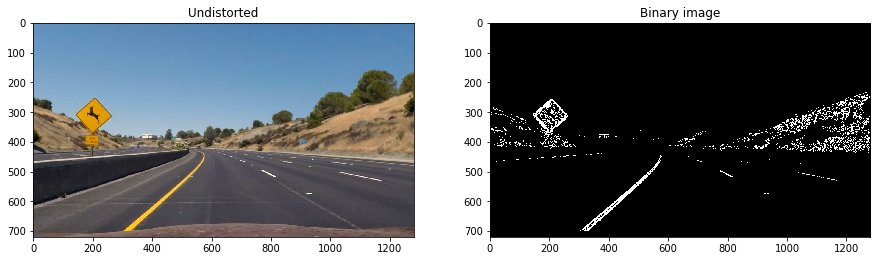

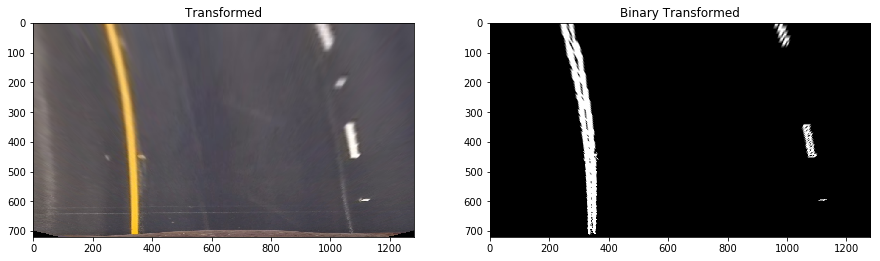

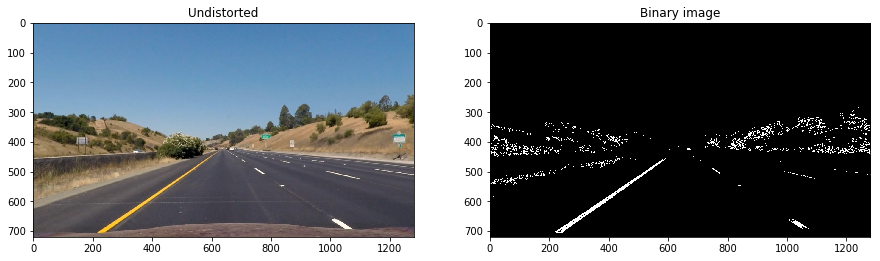

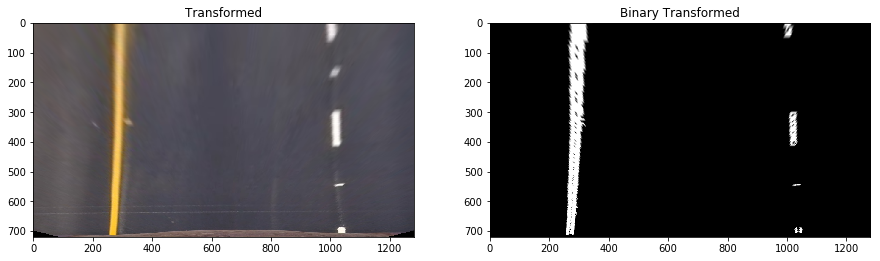

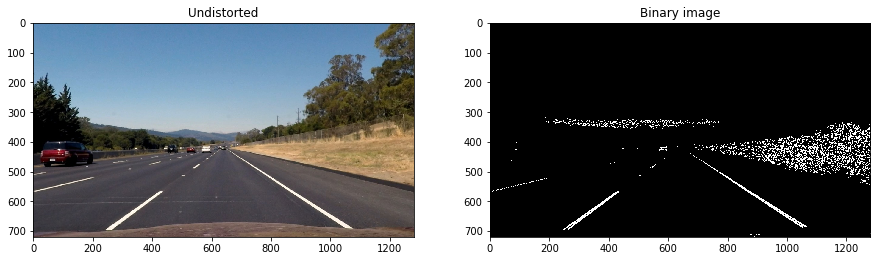

...

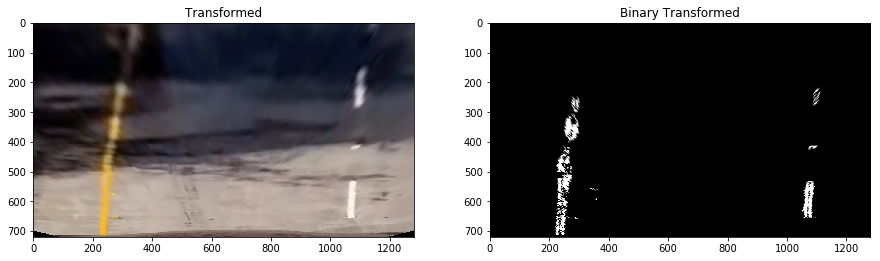

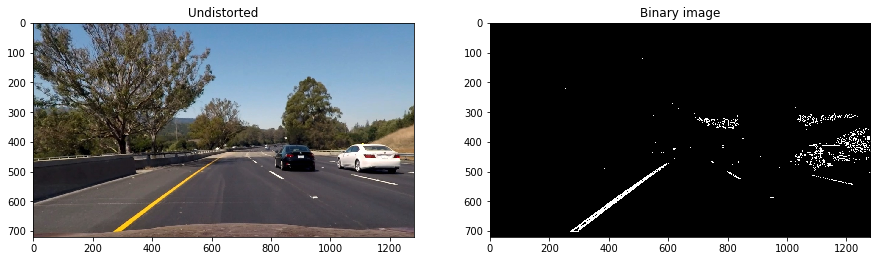

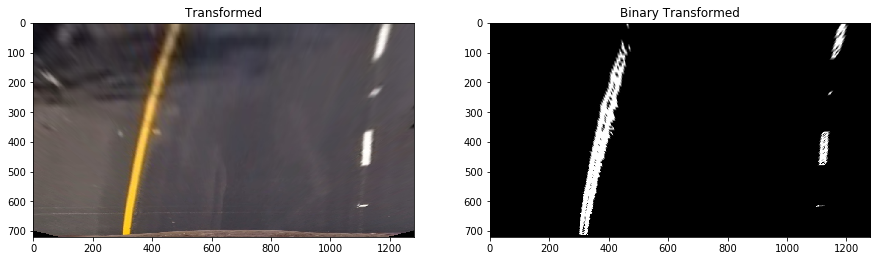

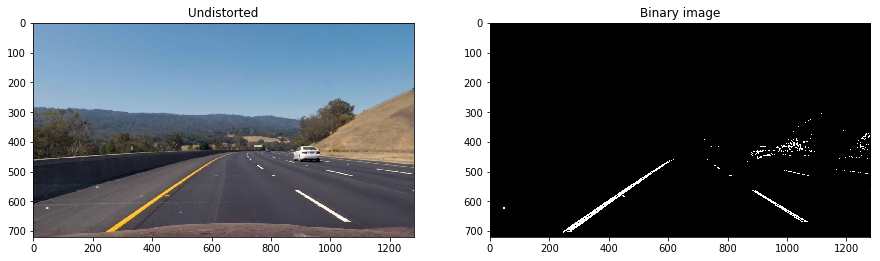

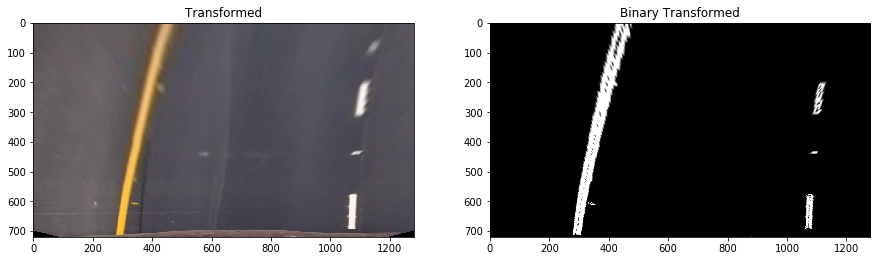

In [7]:
test_path = 'test_images/'
test_imgs = []
for filename in os.listdir(test_path):
    img = cv2.cvtColor(cv2.imread(os.path.join(test_path,filename)), cv2.COLOR_BGR2RGB)
    if img is not None:
        test_imgs.append(img)

for test_im in test_imgs:
    und_im = undistort(test_im, mtx, dist)
    transformed = cv2.warpPerspective(und_im, M, (1280, 720), flags=cv2.INTER_LINEAR)
    merged = all_thresholds(und_im)
    binary_trans = cv2.warpPerspective(merged, M, (1280, 720), flags=cv2.INTER_LINEAR)
    
    fig, axe = plt.subplots(1, 2, figsize=(15,12))
    axe[0].imshow(und_im)
    axe[0].set_title('Undistorted')
    axe[1].imshow(merged, cmap='gray')
    axe[1].set_title('Binary image')
    
    f, ax = plt.subplots(1, 2, figsize=(15,12))
    ax[0].imshow(transformed)
    ax[0].set_title('Transformed')
    ax[1].imshow(binary_trans, cmap='gray')
    ax[1].set_title('Binary Transformed')
plt.show()

# 4. Line finder

With the warped binary iomaged obtained, the detection of the lane lines is accomplished by detecting the variations of the pixel brightness from image's bottom to top.

In [8]:
def find_lines(img):
    # Create a histogram for the bottom of the image
    histogram = np.sum(img[img.shape[0]/2:,:], axis=0)
    # Create an output image to visualize the result
    out_img = np.dstack((img, img, img))*255
    # Find the peak of the left and right halves of the histogram for correspondent left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    n_win = 9
    # Set height of windows
    win_h = np.int(img.shape[0]/n_win)
    # Identify the x and y positions of the nonzero pixels
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows with a margin
    margin = 110
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangles list for visualization
    rectangles = []

    # Step through the windows one by one
    for win in range(n_win):
        # Identify window boundaries in x and y for both right and left parts
        win_y_low = img.shape[0] - (win+1)*win_h
        win_y_high = img.shape[0] - win*win_h
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangles.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))

        # Draw the windows on the visualization image
        #cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
        #cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for visualization
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, rectangles

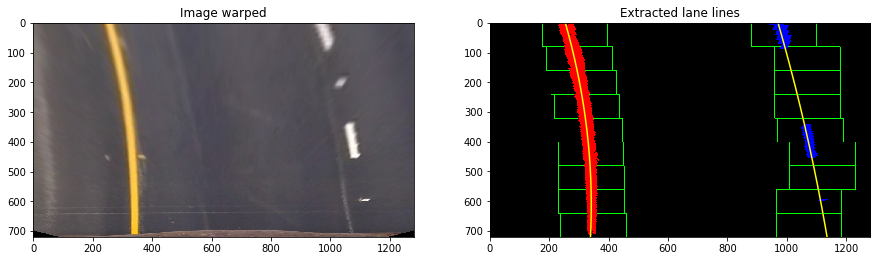

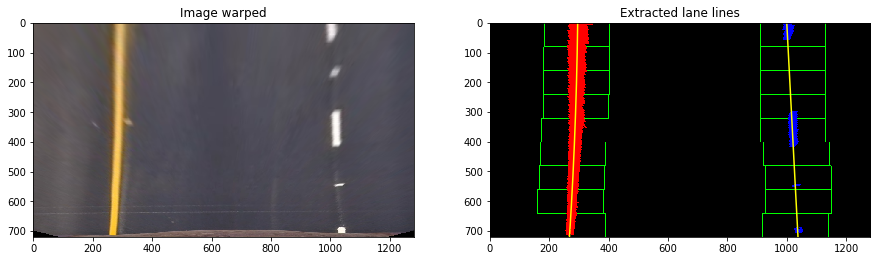

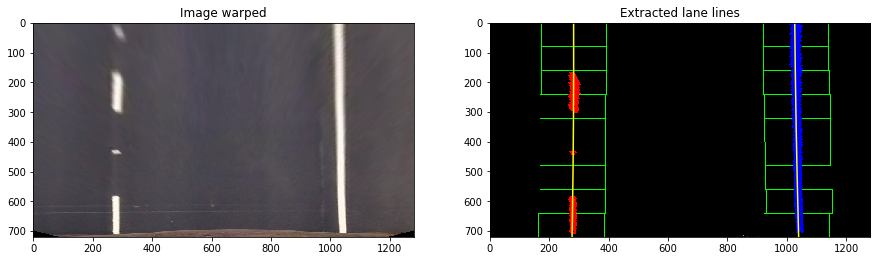

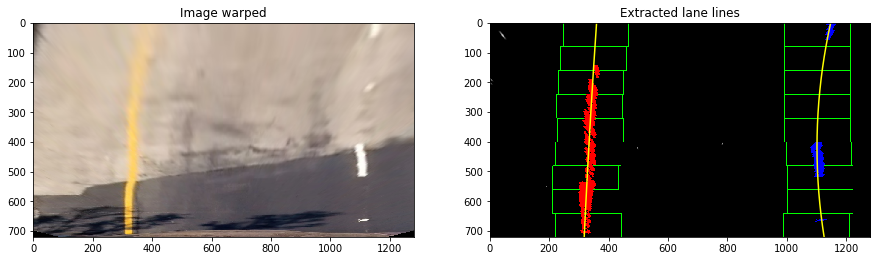

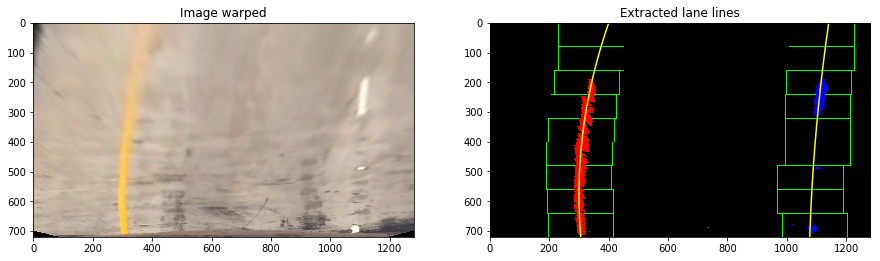

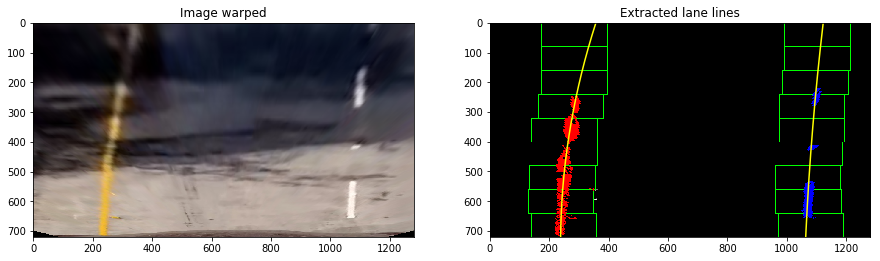

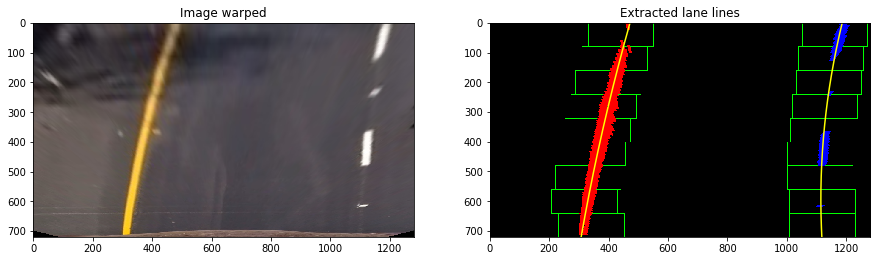

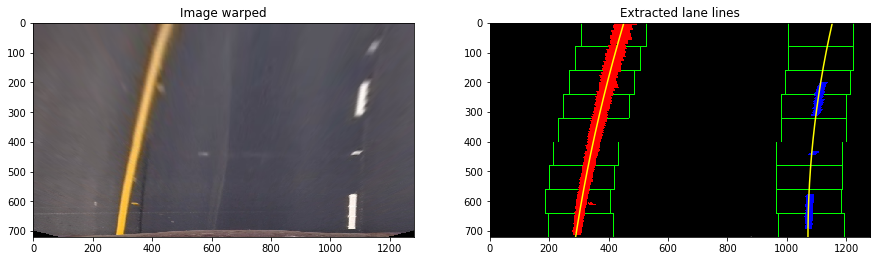

In [9]:
# visualize the result on test images
test_path = 'test_images/'
test_imgs = []
for filename in os.listdir(test_path):
    img = cv2.cvtColor(cv2.imread(os.path.join(test_path,filename)), cv2.COLOR_BGR2RGB)
    if img is not None:
        test_imgs.append(img)

for test_im in test_imgs:
    und_im = undistort(test_im, mtx, dist)
    transformed = cv2.warpPerspective(und_im, M, (1280, 720), flags=cv2.INTER_LINEAR)
    merged = all_thresholds(und_im)
    binary_trans = cv2.warpPerspective(merged, M, (1280, 720), flags=cv2.INTER_LINEAR)

    left_fit, right_fit, left_lane_inds, right_lane_inds, rectangles = find_lines(binary_trans)

    h = binary_trans.shape[0]
    left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
    right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]

    # Create an output image to draw on and  visualize the result
    out_img = np.uint8(np.dstack((binary_trans, binary_trans, binary_trans))*255)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_trans.shape[0]-1, binary_trans.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    for rect in rectangles:
    # Draw the windows on the visualization image
        cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
        cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_trans.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    f, ax = plt.subplots(1, 2, figsize=(15,12))
    ax[0].imshow(transformed)
    ax[0].set_title('Image warped')
    ax[1].imshow(out_img)
    ax[1].set_title('Extracted lane lines')
    ax[1].plot(left_fitx, ploty, color='yellow')
    ax[1].plot(right_fitx, ploty, color='yellow')
    ax[1].set_xlim(0, 1280)
    ax[1].set_ylim(720, 0)
    plt.show()


# 4a. Polyfit using previous frame information

This function is used for detecting lane lines in a video stream, taking into account the lines detected in the previous frame of the video.

In [10]:
def polyfit_new_frame(bin_img, left_fit_prev, right_fit_prev):
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

# 5. Curvature measurement

With the interpolated lines, it would be possible to measure the curvature of the lines found and the position of the car with respect to the lane center.

In [11]:
def radcurv_and_centerpos(img, left_fit, right_fit, left_lane_inds, right_lane_inds):
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/800 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    
    # Define y-value where we want radius of curvature
    h = img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials in world space
        left_fit_cr = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    # Distance from center is image x midpoint - mean of left_fit and right_fit intercepts 
    car_position = img.shape[1]/2
    left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
    right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
    lane_center_position = (right_fit_x_int + left_fit_x_int) /2
    center_dist = (car_position - lane_center_position) * xm_per_pix
    
    return left_curverad, right_curverad, center_dist

In [12]:
test_path = 'test_images/'
test_imgs = []
for filename in os.listdir(test_path):
    img = cv2.cvtColor(cv2.imread(os.path.join(test_path,filename)), cv2.COLOR_BGR2RGB)
    if img is not None:
        test_imgs.append(img)

for test_im in test_imgs:
    und_im = undistort(test_im, mtx, dist)
    transformed = cv2.warpPerspective(und_im, M, (1280, 720), flags=cv2.INTER_LINEAR)
    merged = all_thresholds(und_im)
    binary_trans = cv2.warpPerspective(merged, M, (1280, 720), flags=cv2.INTER_LINEAR)
    
    left_fit, right_fit, left_lane_inds, right_lane_inds, rectangles = find_lines(binary_trans)
    r_left, r_right, dist_center = radcurv_and_centerpos(binary_trans, left_fit, right_fit, left_lane_inds, right_lane_inds)

    print('Radius of curvature:', r_left, 'm,', r_right, 'm')
    print('Distance from lane center:', dist_center, 'm')

Radius of curvature: 431.278058853 m, 1229.01155895 m
Distance from lane center: -0.449891148913 m
Radius of curvature: 2824.82399838 m, 82651.9448803 m
Distance from lane center: -0.0604882833786 m
Radius of curvature: 7155.56500132 m, 8141.76692649 m
Distance from lane center: -0.0858543936504 m
Radius of curvature: 6517.49464714 m, 382.859050014 m
Distance from lane center: -0.378237577562 m
Radius of curvature: 335.409287529 m, 1284.26267203 m
Distance from lane center: -0.240101244293 m
Radius of curvature: 464.121410186 m, 2021.39203067 m
Distance from lane center: -0.0519678916723 m
Radius of curvature: 1343.13061634 m, 492.322304184 m
Distance from lane center: -0.337142933891 m
Radius of curvature: 1013.54858758 m, 639.84422503 m
Distance from lane center: -0.186092497861 m


# 6. Draw lane on original image

Now it is time to annotate the resultant lane on the original frame, along with the information of the curvature radii and the vehicle's lateral displacement.

In [13]:
def draw_lane(img, bin_img, left_fit, right_fit, Minv, r_left, r_right, dist_center):
    new_img = np.copy(img)
    if left_fit is None or right_fit is None:
        return img
    # Create an image to draw the lines
    warp_zero = np.zeros_like(bin_img).astype(np.uint8)
    warp_color = np.dstack((warp_zero, warp_zero, warp_zero))
    
    height, width = bin_img.shape
    ploty = np.linspace(0, height-1, num=height)# to cover same y-range as image
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(warp_color, np.int_([pts]), (0,255, 0))
    cv2.polylines(warp_color, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(warp_color, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(warp_color, Minv, (width, height)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.3, 0)
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, 'Left line curve radius: %dm' % r_left, (50,50), font, 1,(255,255,153),2, cv2.LINE_AA)
    cv2.putText(result, 'Right line curve raidus: %dm' % r_right, (50,100), font, 1,(255,255,153),2, cv2.LINE_AA)
    if dist_center >= 0:
        cv2.putText(result, 'Vehicle is %.2fm right of center' % dist_center, (50,150), font, 1,(255,255,153),2, cv2.LINE_AA)
    else:
        cv2.putText(result, 'Vehicle is %.2fm left of center' % dist_center, (50,150), font, 1,(255,255,153),2, cv2.LINE_AA)
    return result

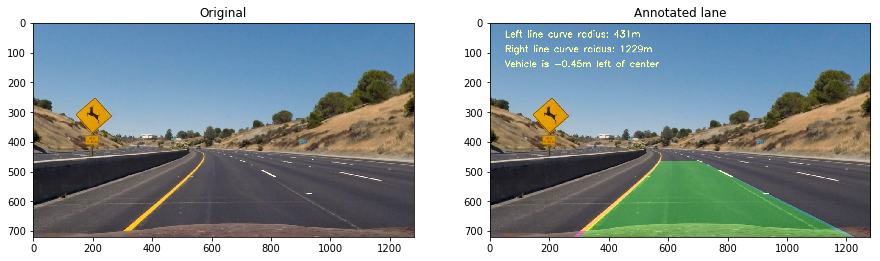

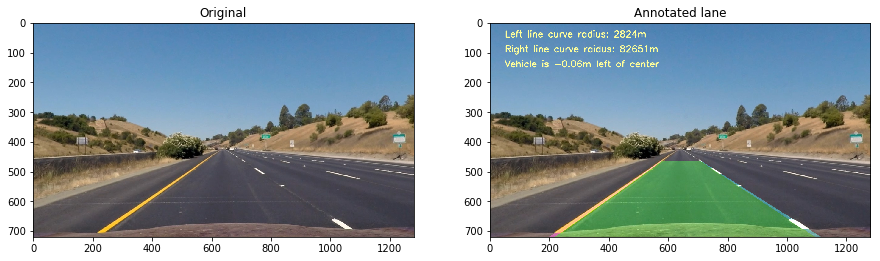

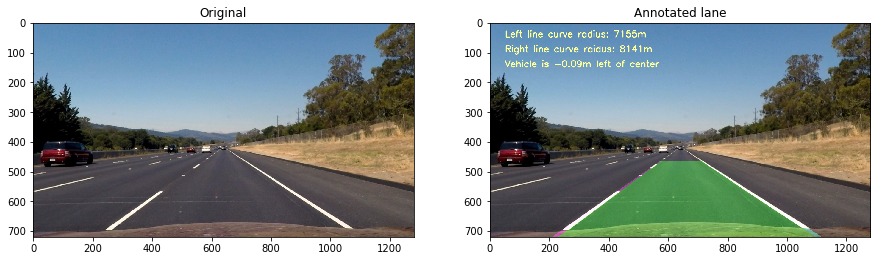

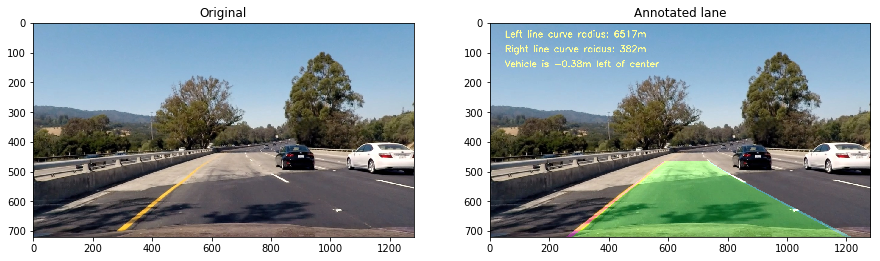

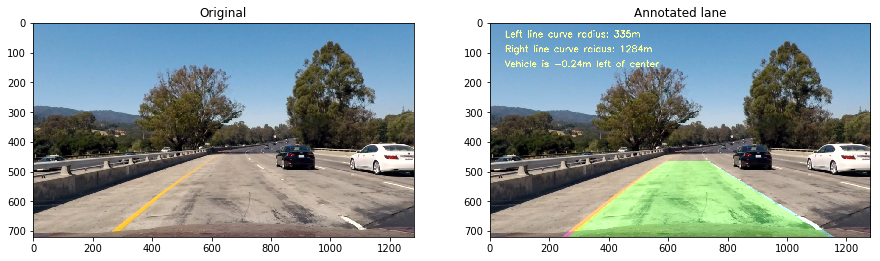

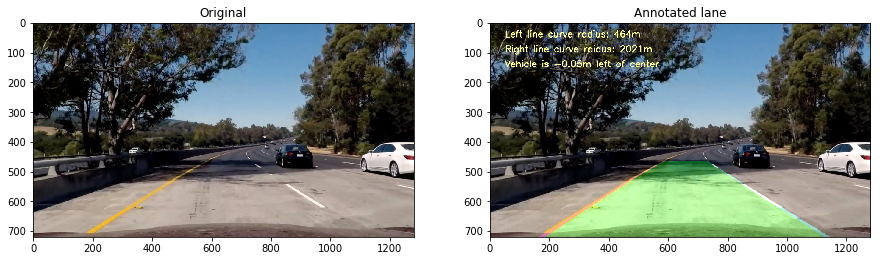

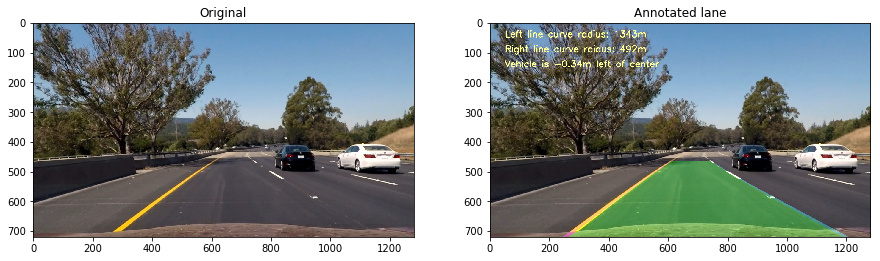

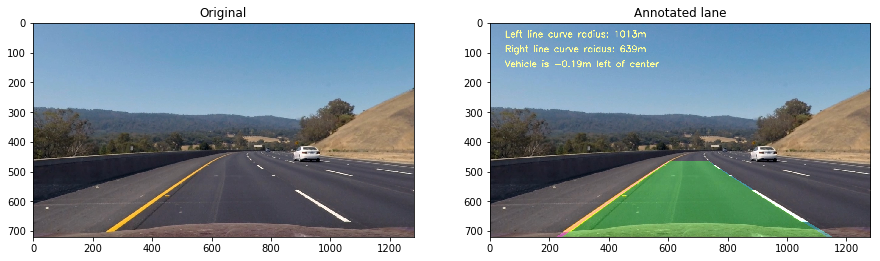

In [14]:
test_path = 'test_images/'
test_imgs = []
for filename in os.listdir(test_path):
    img = cv2.cvtColor(cv2.imread(os.path.join(test_path,filename)), cv2.COLOR_BGR2RGB)
    if img is not None:
        test_imgs.append(img)

for test_im in test_imgs:
    und_im = undistort(test_im, mtx, dist)
    transformed = cv2.warpPerspective(und_im, M, (1280, 720), flags=cv2.INTER_LINEAR)
    merged = all_thresholds(und_im)
    binary_trans = cv2.warpPerspective(merged, M, (1280, 720), flags=cv2.INTER_LINEAR)
    
    left_fit, right_fit, left_lane_inds, right_lane_inds, rectangles = find_lines(binary_trans)
    r_left, r_right, dist_center = radcurv_and_centerpos(binary_trans, left_fit, right_fit, left_lane_inds, right_lane_inds)
    annotated_image = draw_lane(und_im, binary_trans, left_fit, right_fit, Minv, r_left, r_right, dist_center)
    
    f, ax = plt.subplots(1, 2, figsize=(15,12))
    ax[0].imshow(und_im)
    ax[0].set_title('Original')
    ax[1].imshow(annotated_image)
    ax[1].set_title('Annotated lane')
    plt.show()

# 7. Line Class definition

This is a class definition to record the characteristics of each line detection

In [15]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 100.) and len(self.current_fit) > 0:
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # if not found, remove one from the history
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)

# 8. Complete image processing pipeline

In [16]:
def adv_line_finder(img):
    new_img = np.copy(img)
    und_img = undistort(new_img, mtx, dist)
    transformed = cv2.warpPerspective(und_img, M, (1280, 720), flags=cv2.INTER_LINEAR)
    merged = all_thresholds(und_img)
    bin_img = cv2.warpPerspective(merged, M, (1280, 720), flags=cv2.INTER_LINEAR)
    
    # if lane lines were detected last frame, use polyfit_new_frame, otherwise use sliding window
    if not left_line.detected or not right_line.detected:
        left_fit, right_fit, left_lane_inds, right_lane_inds, _ = find_lines(bin_img)
    else:
        left_fit, right_fit, left_lane_inds, right_lane_inds = polyfit_new_frame(bin_img, left_line.best_fit, right_line.best_fit)
    
    left_line.add_fit(left_fit, left_lane_inds)
    right_line.add_fit(right_fit, right_lane_inds)
    
    if left_line.best_fit is not None and right_line.best_fit is not None:
        r_left, r_right, dist_center = radcurv_and_centerpos(bin_img, left_line.best_fit, right_line.best_fit, left_lane_inds, right_lane_inds)
        img_out = draw_lane(und_img, bin_img, left_line.best_fit, right_line.best_fit, Minv, r_left, r_right, dist_center)
    else:
        img_out = new_img
    
    return img_out

# Project Video - processing

In [17]:
left_line = Line()
right_line = Line()
video_output = 'project_video_result.mp4'
video_input = VideoFileClip('project_video.mp4')
processed_video = video_input.fl_image(adv_line_finder)
%time processed_video.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_result.mp4
[MoviePy] Writing video project_video_result.mp4


100%|█████████▉| 1260/1261 [06:48<00:00,  3.05it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_result.mp4 

CPU times: user 12min 39s, sys: 3.63 s, total: 12min 43s
Wall time: 6min 49s
